# Ecuación 1D de Burgers

En el caso de la convección no lineal se estudió la ecuación invísida de Burgers, sin embargo la ecuación de Burgers junta dos fenómenos ya estudiados, la convección no lineal y la difussión, ésta última siendo análoga a un caso con viscosidad. La ecuación de Burgers es

$$\frac{\partial u}{\partial t} + u\frac{\partial u}{\partial x} = \nu \frac{\partial^2 u}{\partial x^2}$$


Discretizando la ecuación tenemos
$$\frac{u_i^{n+1}-u_i^n}{\Delta t} + u_i^n \frac{u_i^n-u_{i-1}^n}{\Delta x} = \nu \frac{u_{i+1}^n+u_{i-1}^n-2u_i^n}{\left(\Delta x\right)^2} $$
De donde

$$u_i^{n+1}=u_i^n -u_i^n \frac{\Delta t}{\Delta x}\left(u_i^n-u_{i-1}^n\right) +\nu \frac{ \Delta t}{\left(\Delta x\right)^2} \left(u_{i+1}^n+u_{i-1}^n-2u_i^n \right)$$

In [1]:
#Se importan las librerias de numpy, sympy y para graficar matplotlib
from numpy import *
from matplotlib.pyplot import *
from matplotlib import animation
from JSAnimation import IPython_display
%matplotlib inline

Tratemos de resolver la ecuación de Burgers con las siguientes condiciones iniciales
$$u(x,0) = 2+2sin(4 x)$$

Y con condiciones periódicas en la variable $x \in \left[ 0,2pi \right)$

## Implementación de las condiciones iniciales

In [6]:
#Se definen las variables
nx = 101
nt = 100
dx = 2.*pi/(nx-1)
nu = 0.07
#Se utiliza la condicion CFL
dt = dx*nu

N = 2

x = linspace(0., 2.*pi, nx)
un = empty(nx)
t = 0

#Se asigna a u la evaluacion de la funcion ufunc que es la condicion inicial para los puntos de la malla espacial
u = 2*ones(nx) + 2*sin(N*x)

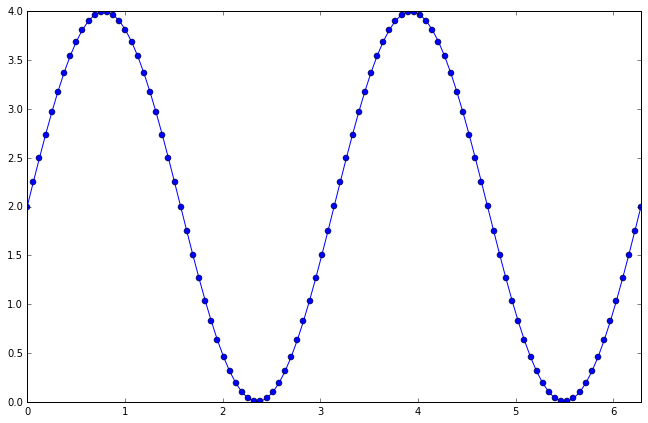

In [7]:
figure(figsize=(11,7), dpi=100)
plot(x, u, marker='o',color='b', label=u'Condición inicial de la ecuación de Burgers')
xlim([0,2*pi])
ylim([0,4]);

## Implementación de las condiciones de frontera y el método de discretización

De la discretizando la ecuación tenemos
$$u_i^{n+1}=u_i^n -u_i^n \frac{\Delta t}{\Delta x}\left(u_i^n-u_{i-1}^n\right) +\nu \frac{ \Delta t}{\left(\Delta x\right)^2} \left(u_{i+1}^n+u_{i-1}^n-2u_i^n \right)$$

La condición de frontera que sea periodica, $u(x,t)=u(x+2\pi,t)$ impone condiciones sobre como debemos de calcular el siguiente paso en el tiempo de la fucnión en los extremos, $\textit{i.e.}$ en $x=0$ y en $x=2\pi$, claro está que debemos de calcular en el inicio y final de nuestra malla espacial.

In [18]:
def avance_en_tiempo_peri(u0, nx, nt, dx, nu, sigma, flag=False):
    #Se utiliza la condicion CFL
    dt = sigma*dx*nu
    u = u0
    if flag: hist=[]
    for n in range(nt):
        un = u.copy()
        if flag: hist.append(un)
        for i in range(1, nx-1):
            u[i] = un[i] - un[i] * dt/dx *(un[i] - un[i-1]) + (nu*dt/dx**2)*(un[i+1]-2*un[i]+un[i-1])

        u[0] = un[0] - un[0] * (dt/dx) * (un[0] - un[-1]) + (nu*dt/dx**2)*(un[1]-2*un[0]+un[-1])
        u[-1] = un[-1] - un[-1] * (dt/dx) * (un[-1] - un[-2]) + (nu*dt/dx**2)*(un[0]-2*un[-1]+un[-2])
    
    if flag:
        return hist
    else:
        return u

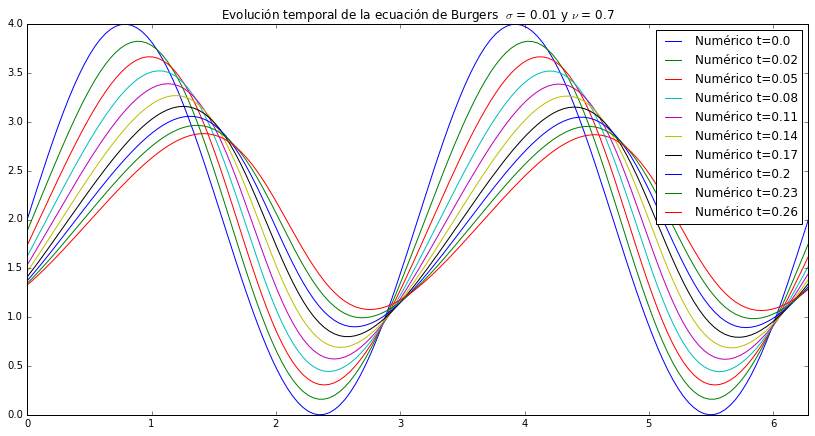

In [19]:
#Se definen las variables
nx = 151
nt = 100
dx = 2.*pi/(nx-1)
nu = 0.7
sigma=0.01

x = linspace(0., 2.*pi, nx)
t = 0

figure(figsize=(14,7), dpi=100)
for nt in range(0, 1000, 100):
    dt = sigma*dx*nu
    u0 = 2*ones(nx) + 2*sin(N*x)
    u = avance_en_tiempo_peri(u0, nx, nt, dx, nu, sigma)
    
    plot(x, u, label=u'Numérico t='+str(trunc(100*nt*dt)/100))
    title(u'Evolución temporal de la ecuación de Burgers  $\sigma$ = '+str(sigma)+' y $\\nu$ = '+str(nu))
    xlim([0,2*pi])
    ylim([0,4])
    legend()


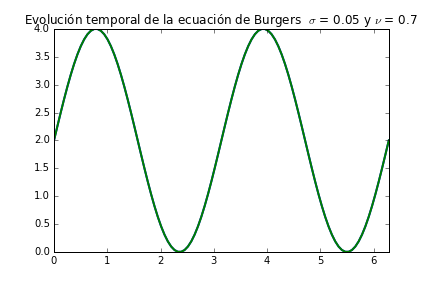
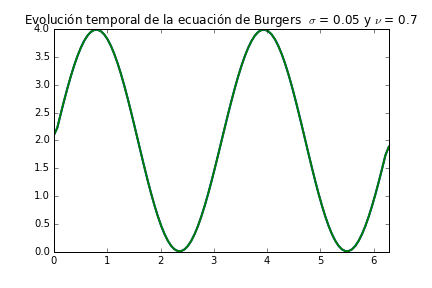
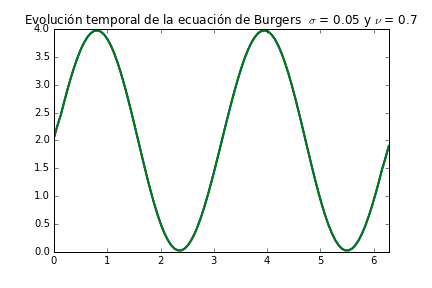
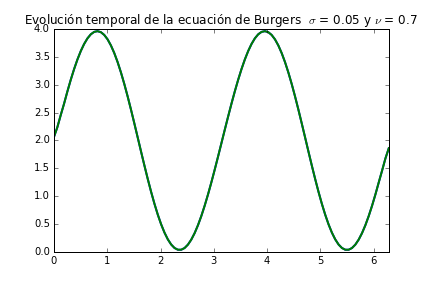
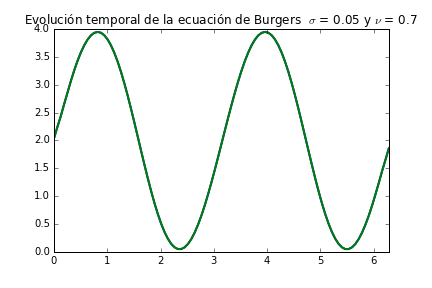
...
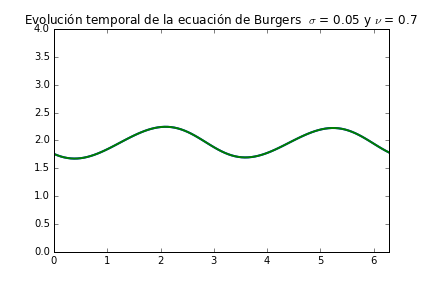
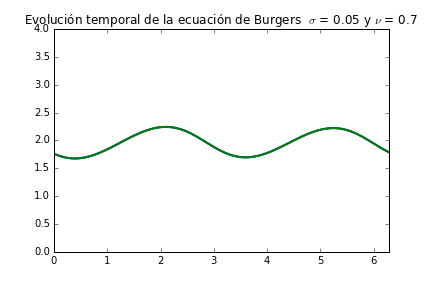
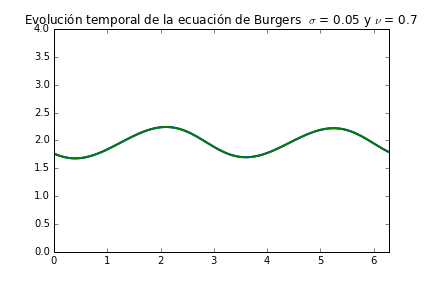
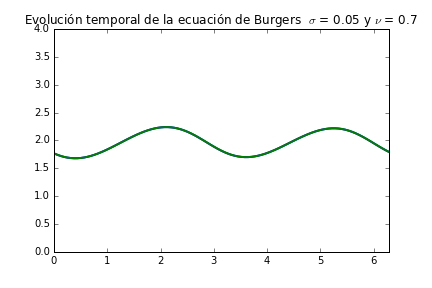
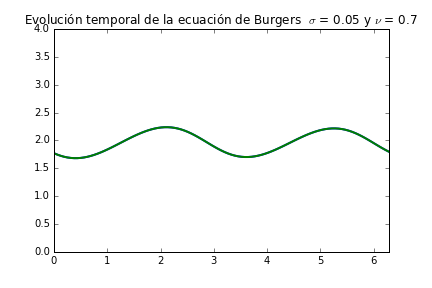

In [10]:
#Se definen las variables
nx = 101
dx = 2.*pi/(nx-1)
nu = 0.7
sigma = 0.05
nt = 300
x = linspace(0., 2.*pi, nx)
t = 0

dt = sigma*dx*nu
u0 = 2*ones(nx) + 2*sin(N*x)
    
u_sol = avance_en_tiempo_peri(u0, nx, nt, dx, nu, sigma, True)

# Se define el ambiente en el que queremos hacer la animación
fig = figure()
ax = axes(xlim=(0, 2*pi), ylim=(0., 4.))
linea1, = ax.plot([], [], lw=2)
linea2, = ax.plot([], [], lw=2)

# Funcion para inicializar cada cuadro de la animacion
def init():
    linea1.set_data([], [])
    linea2.set_data([], [])
    return linea1,linea2

# Esta funcion se llama de manera secuencial para cada elemento i.
def animate(i):
    x = linspace(0, 2*pi, nx)
    y1 = u_sol[i]
    y2 = u_sol[i]
    linea1.set_data(x, y1),linea2.set_data(x, y2),
    ax.set_title(u'Evolución temporal de la ecuación de Burgers  $\sigma$ = '+str(sigma)+' y $\\nu$ = '+str(nu))
    return linea1,linea2,

# Se llama a la animacion.  blit=True es para que solo se dibije las partes de la imagen que tienen cambios.
animation.FuncAnimation(fig, animate, init_func=init, frames=nt, interval=20, blit=True)

#### Otro intento

Abora resolvamos la ecuación de Burgers con las siguientes condiciones iniciales
$$u(x,0) = sin(4 x)$$
Con condiciones en la frontera de tipo Dirichlet homogeneas
$$u(0,t)=u(2\pi,t)=0$$

In [16]:
def avance_en_tiempo(u0, nx, nt, dx, nu, sigma, flag=False):
    #Se utiliza la condicion CFL
    dt = sigma*dx*nu
    u = u0
    if flag: hist=[]
    for n in range(nt):
        un = u.copy()
        if flag: hist.append(un)
        for i in range(1, nx-1):
            u[i] = un[i] - un[i] * dt/dx *(un[i] - un[i-1]) + (nu*dt/dx**2)*(un[i+1]-2*un[i]+un[i-1])

        u[0] = 2
        u[-1] = 2
    
    if flag:
        return hist
    else:
        return u

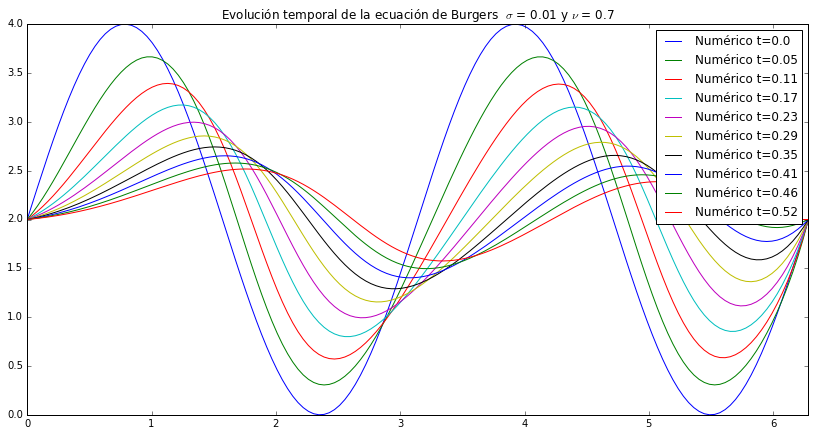

In [17]:
#Se definen las variables
nx = 151
nt = 100
dx = 2.*pi/(nx-1)
nu = 0.7
sigma=0.01

x = linspace(0., 2.*pi, nx)
t = 0

figure(figsize=(14,7), dpi=100)
for nt in range(0, 2000, 200):
    dt = sigma*dx*nu
    u0 = 2+2*sin(N*x)
    u = avance_en_tiempo(u0, nx, nt, dx, nu, sigma)
    
    plot(x, u, label=u'Numérico t='+str(trunc(100*nt*dt)/100))
    title(u'Evolución temporal de la ecuación de Burgers  $\sigma$ = '+str(sigma)+' y $\\nu$ = '+str(nu))
    xlim([0,2*pi])
    ylim([0,4])
    legend()


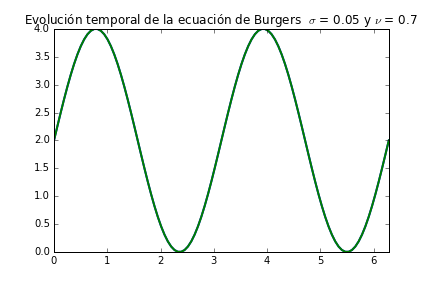
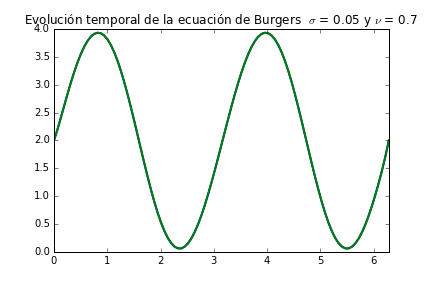
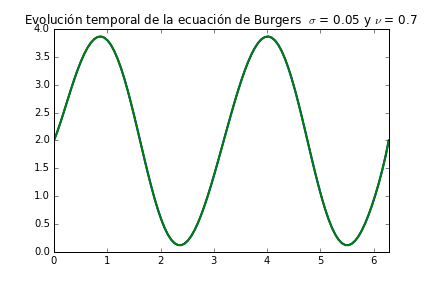
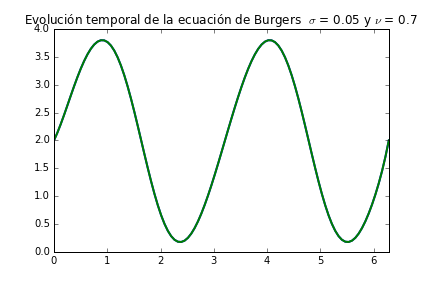
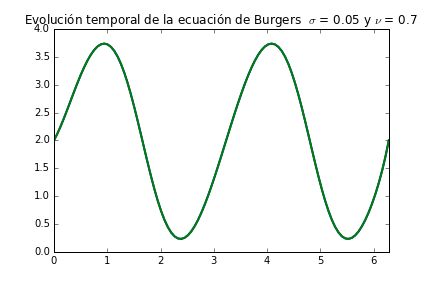
...
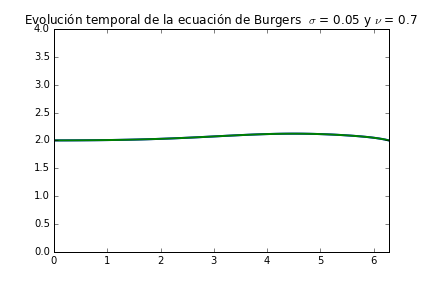
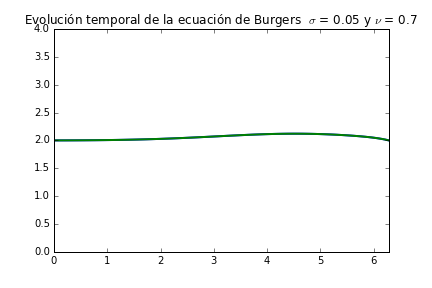
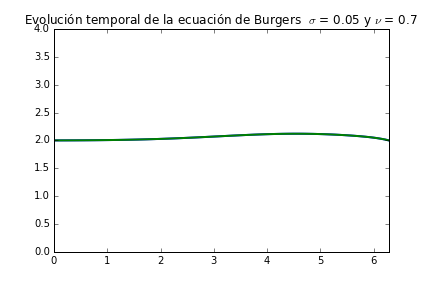
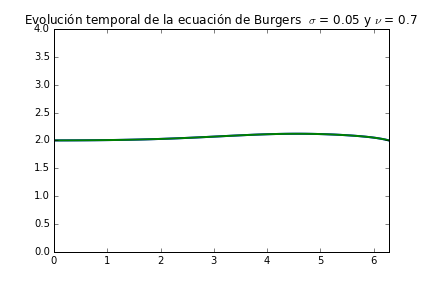
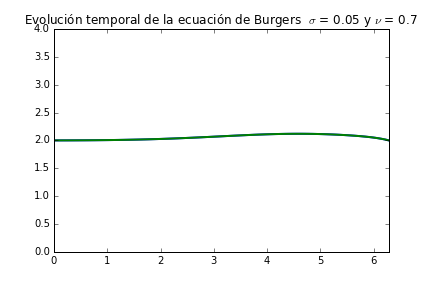

In [21]:
#Se definen las variables
nx = 101
dx = 2.*pi/(nx-1)
nu = 0.7
sigma = 0.05
nt = 1000
x = linspace(0., 2.*pi, nx)
t = 0

dt = sigma*dx*nu
u0 = 2*ones(nx) + 2*sin(N*x)
    
u_sol = avance_en_tiempo(u0, nx, nt, dx, nu, sigma, True)

# Se define el ambiente en el que queremos hacer la animación
fig = figure()
ax = axes(xlim=(0, 2*pi), ylim=(0., 4.))
linea1, = ax.plot([], [], lw=2)
linea2, = ax.plot([], [], lw=2)

# Funcion para inicializar cada cuadro de la animacion
def init():
    linea1.set_data([], [])
    linea2.set_data([], [])
    return linea1,linea2

# Esta funcion se llama de manera secuencial para cada elemento i.
def animate(i):
    x = linspace(0, 2*pi, nx)
    y1 = u_sol[5*i]
    y2 = u_sol[5*i]
    linea1.set_data(x, y1),linea2.set_data(x, y2),
    ax.set_title(u'Evolución temporal de la ecuación de Burgers  $\sigma$ = '+str(sigma)+' y $\\nu$ = '+str(nu))
    return linea1,linea2,

# Se llama a la animacion.  blit=True es para que solo se dibije las partes de la imagen que tienen cambios.
animation.FuncAnimation(fig, animate, init_func=init, frames=nt/5, interval=20, blit=True)